In [1]:
#IMPORTING PYTHON LIBRARIES
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option("display.max_rows", 60000)
pd.set_option("display.max_columns", 250)

In [ ]:
#INSTALLING CATBOOST
!pip install catboost

#**MOUNTING MY GOOGLE DRIVE**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#**READING IN THE TEST DATASET**

In [3]:
Test=pd.read_csv("/content/drive/My Drive/DSN_Afolashade/Test.csv")

#**UNDERSTAING THE TEST DATASET**

In [ ]:
Test.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50
0,Apcnt_1000032,3236.0,0.34875,10.2006,0.0000,0.0,418564.0,418564.0,418564.0,540710.0,0.0,1649749.0,5446.0,0.0,48187375,114686147.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,1086.0,6204.0,2676.0,60.0,14691.0,9794.0,NaN,238.0,1.8334,0.0,NaN,22.0,2.0,14.0,0.0,NaN,NaN,0.825000,1.01,0.800000,NaN,0.0,charge,NaN,0.000000,0.011221
1,Apcnt_1000048,3284.0,1.27360,2.9606,9.0198,0.0,0.0,9858816.0,49014.0,1510098.0,18308285.0,622789.0,1025793.0,1396510.0,34694910,87479487.0,1.0,1.0,1.0,2.0,2.0,142.560,NaN,NaN,570.585,3082.5,10221.0,6814.0,60.0,11955.0,3528.0,NaN,1216.0,19.5000,3.0,NaN,30.0,18.0,14.0,2.0,NaN,18.8415,0.507694,4.04,0.623248,1.0,0.0,lending,NaN,0.504974,0.043525
2,Apcnt_1000052,NaN,0.27505,0.0600,0.0000,0.0,NaN,NaN,NaN,NaN,0.0,118256.0,NaN,NaN,21973443,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,852.0,4836.0,NaN,NaN,NaN,7.8334,0.0,NaN,2.0,NaN,0.0,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,charge,NaN,0.000000,NaN
3,Apcnt_1000076,3232.0,0.28505,2.8032,0.0000,0.0,0.0,473802.0,473802.0,1724437.0,493641.0,1391064.0,1176725.0,1220293.0,16576457,NaN,2.0,2.0,2.0,3.0,3.0,109.005,13050.00,NaN,109.005,1414.5,4197.0,2798.0,60.0,14964.0,NaN,NaN,248.0,9.0000,1.0,1.0,36.0,0.0,26.0,0.0,NaN,NaN,0.916663,2.02,0.464224,NaN,NaN,charge,90.163742,0.788809,0.104029
4,Apcnt_1000080,3466.0,2.09545,0.8318,2.5182,0.0,19839.0,1150662.0,1150662.0,7860523.0,5752921.0,271133.0,613064.0,4779643.0,48187375,72049802.0,0.0,0.0,0.0,3.0,3.0,139.065,469.29,469.29,15.180,2724.0,9855.0,6570.0,182.0,11679.0,5900.0,NaN,2388.0,16.6666,1.0,0.0,24.0,28.0,20.0,0.0,NaN,NaN,0.234047,23.23,0.726688,0.0,0.0,lending,1303.587148,1.637733,0.163124


In [ ]:
Test.tail()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50
23995,Apcnt_999940,3258.0,0.37925,0.5698,5.1282,0.0000,NaN,2280318.0,NaN,NaN,2280318.0,1743887.0,NaN,0.0,21973443,126128971.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,547.5,NaN,NaN,304.0,3741.0,2068.0,NaN,24.0,0.3334,0.0,0.0,6.0,0.0,6.0,0.0,NaN,92.6910,1.100000,0.00,0.800000,NaN,1.0,charge,NaN,0.000000,NaN
23996,Apcnt_999956,3514.0,0.95260,0.0000,0.0000,0.0000,1494538.0,4773419.0,4773419.0,89718571.0,12999991.0,NaN,48989882.0,97696961.0,96375139,NaN,0.0,0.0,0.0,3.0,3.0,123.195,11663.055,NaN,123.195,1485.0,6387.0,4258.0,60772.0,14691.0,3286.0,NaN,586.0,14.1666,0.0,0.0,10.0,2.0,8.0,0.0,NaN,125.0220,0.000000,12.12,0.196400,0.0,0.0,charge,4200.072959,3.000000,0.930931
23997,Apcnt_999976,3302.0,0.05755,4.2394,0.0000,25.4376,NaN,49403.0,NaN,NaN,49403.0,215895.0,NaN,0.0,21973443,NaN,NaN,NaN,0.0,0.0,1.0,NaN,13080.000,NaN,NaN,2304.0,NaN,NaN,60.0,10038.0,NaN,5109.0,202.0,5.3334,0.0,NaN,8.0,4.0,2.0,0.0,NaN,NaN,1.100000,1.01,0.800000,NaN,0.0,charge,NaN,4.855060,NaN
23998,Apcnt_999984,3334.0,0.75670,1.4428,0.0000,0.0000,0.0,2513329.0,37733.0,393668.0,2551062.0,121757.0,355935.0,673748.0,16576457,NaN,1.0,2.0,2.0,2.0,2.0,129.435,13024.995,13024.995,138.450,706.5,2463.0,1642.0,0.0,6297.0,2312.0,NaN,62.0,2.6666,0.0,0.0,12.0,0.0,4.0,0.0,NaN,31.1955,0.440000,2.02,0.519776,NaN,0.0,charge,27.325129,0.818733,0.023749
23999,Apcnt_999992,3324.0,0.44840,2.3170,6.7176,0.0000,NaN,5305182.0,NaN,18885950.0,5361587.0,1121098.0,0.0,3031477.0,48187375,NaN,0.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,124.980,9319.5,30204.0,20136.0,60.0,30204.0,9672.0,NaN,1634.0,24.8334,0.0,NaN,6.0,8.0,0.0,0.0,NaN,112.3035,0.314281,3.03,0.544352,0.0,1.0,charge,NaN,0.000000,0.391927


In [ ]:
Test.columns

Index(['Applicant_ID', 'form_field1', 'form_field2', 'form_field3',
       'form_field4', 'form_field5', 'form_field6', 'form_field7',
       'form_field8', 'form_field9', 'form_field10', 'form_field11',
       'form_field12', 'form_field13', 'form_field14', 'form_field15',
       'form_field16', 'form_field17', 'form_field18', 'form_field19',
       'form_field20', 'form_field21', 'form_field22', 'form_field23',
       'form_field24', 'form_field25', 'form_field26', 'form_field27',
       'form_field28', 'form_field29', 'form_field30', 'form_field31',
       'form_field32', 'form_field33', 'form_field34', 'form_field35',
       'form_field36', 'form_field37', 'form_field38', 'form_field39',
       'form_field40', 'form_field41', 'form_field42', 'form_field43',
       'form_field44', 'form_field45', 'form_field46', 'form_field47',
       'form_field48', 'form_field49', 'form_field50'],
      dtype='object')

In [ ]:
Test.shape

(24000, 51)

In [ ]:
Test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24000 entries, 0 to 23999
Data columns (total 51 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Applicant_ID  24000 non-null  object 
 1   form_field1   22890 non-null  float64
 2   form_field2   22291 non-null  float64
 3   form_field3   23854 non-null  float64
 4   form_field4   23854 non-null  float64
 5   form_field5   23854 non-null  float64
 6   form_field6   18396 non-null  float64
 7   form_field7   21769 non-null  float64
 8   form_field8   18396 non-null  float64
 9   form_field9   20600 non-null  float64
 10  form_field10  23853 non-null  float64
 11  form_field11  10602 non-null  float64
 12  form_field12  19817 non-null  float64
 13  form_field13  21537 non-null  float64
 14  form_field14  24000 non-null  int64  
 15  form_field15  14408 non-null  float64
 16  form_field16  18526 non-null  float64
 17  form_field17  19305 non-null  float64
 18  form_field18  19631 non-nu

In [ ]:
Test.describe()

,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field48,form_field49,form_field50
count,22890.000000,22291.000000,23854.000000,23854.000000,23854.000000,1.839600e+04,2.176900e+04,1.839600e+04,2.060000e+04,2.385300e+04,1.060200e+04,1.981700e+04,2.153700e+04,2.400000e+04,1.440800e+04,18526.000000,19305.000000,19631.000000,24000.000000,23853.000000,17293.000000,15276.000000,11875.000000,18395.000000,21744.000000,20828.000000,20090.000000,23853.000000,23853.000000,13092.000000,7190.000000,21744.000000,23505.000000,23853.000000,14134.000000,23097.000000,21744.000000,23853.000000,22171.000000,5172.000000,7651.000000,23422.000000,23750.000000,21638.000000,10462.000000,17115.000000,1.507800e+04,23854.000000,1.920300e+04
mean,3492.284404,0.557676,1.065443,0.859146,2.183538,6.263036e+05,6.797033e+06,2.654142e+06,1.350593e+07,1.187478e+07,2.132302e+06,2.772047e+06,5.984000e+06,9.291862e+07,1.141483e+08,0.234265,0.267651,0.272477,0.938458,1.020459,87.114080,6653.189477,6473.026142,105.934375,2626.358030,10109.255617,6199.305027,17715.546221,16507.914099,5248.247174,10934.016134,946.711921,14.148066,0.229740,0.194071,12.777157,8.554544,8.506184,0.090749,147.623280,108.209648,0.369684,6.580480,0.566219,0.066526,0.097926,3.015440e+05,1.064118,6.749843e+05
std,190.502764,0.826543,2.198444,3.403115,11.415706,1.457540e+06,1.626022e+07,3.968185e+06,2.289125e+07,2.477113e+07,5.733605e+06,4.794095e+06,1.947650e+07,3.768364e+09,1.194017e+08,0.622532,0.701223,0.706765,1.705298,1.757307,53.179142,5701.118265,5929.962163,479.903878,1946.845869,8787.532233,5388.387561,27153.459422,9672.296721,3138.183322,6168.907825,1057.985881,15.511387,0.671496,0.558517,10.451113,9.469110,7.833898,0.408602,43.580328,36.426276,0.414077,6.363075,0.196060,0.278211,0.370392,1.868574e+06,1.816837,6.561031e+06
min,2986.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.811573e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.405000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166600,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.075000,0.000000,0.000000,0.000000,0.066432,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,3356.000000,0.068675,0.000000,0.000000,0.000000,1.400400e+04,6.725810e+05,1.816630e+05,1.349441e+06,4.208980e+05,2.039332e+05,2.715220e+05,2.007240e+05,1.657646e+07,4.952544e+07,0.000000,0.000000,0.000000,0.000000,0.000000,40.545000,1140.933750,858.157500,14.730000,1231.500000,3375.000000,2068.000000,60.000000,9765.000000,2312.000000,6297.000000,194.000000,2.500000,0.000000,0.000000,6.000000,2.000000,4.000000,0.000000,135.531750,87.499500,0.000000,2.020000,0.413268,0.000000,0.000000,7.272364e+01,0.000000,4.500510e-02
50%,3484.000000,0.273250,0.058200,0.000000,0.000000,1.155330e+05,2.719888e+06,9.594685e+05,5.529830e+06,3.651543e+06,6.727755e+05,1.149495e+06,1.563391e+06,2.814143e+07,8.326778e+07,0.000000,0.000000,0.000000,0.000000,0.000000,90.135000,5918.475000,5561.535000,60.690000,2212.500000,8214.000000,5110.000000,486.000000,15057.000000,5658.000000,10677.000000,600.000000,7.833400,0.000000,0.000000,10.000000,6.000000,6.000000,0.000000,150.000000,117.984000,0.220000,5.050000,0.592100,0.000000,0.000000,3.131754e+02,0.000000,1.680000e-01
75%,3624.000000,0.728850,1.304250,0.000000,0.000000,5.159112e+05,7.073576e+06,3.799849e+06,1.728658e+0

#**TEST DATASET DATA CLEANING**

In [ ]:
Test.isnull().sum()

Applicant_ID        0
form_field1      1110
form_field2      1709
form_field3       146
form_field4       146
form_field5       146
form_field6      5604
form_field7      2231
form_field8      5604
form_field9      3400
form_field10      147
form_field11    13398
form_field12     4183
form_field13     2463
form_field14        0
form_field15     9592
form_field16     5474
form_field17     4695
form_field18     4369
form_field19        0
form_field20      147
form_field21     6707
form_field22     8724
form_field23    12125
form_field24     5605
form_field25     2256
form_field26     3172
form_field27     3910
form_field28      147
form_field29      147
form_field30    10908
form_field31    16810
form_field32     2256
form_field33      495
form_field34      147
form_field35     9866
form_field36      903
form_field37     2256
form_field38      147
form_field39     1829
form_field40    18828
form_field41    16349
form_field42      578
form_field43      250
form_field44     2362
form_field

In [ ]:
Test=Test.fillna(-999)
Test.isnull().sum()

Applicant_ID    0
form_field1     0
form_field2     0
form_field3     0
form_field4     0
form_field5     0
form_field6     0
form_field7     0
form_field8     0
form_field9     0
form_field10    0
form_field11    0
form_field12    0
form_field13    0
form_field14    0
form_field15    0
form_field16    0
form_field17    0
form_field18    0
form_field19    0
form_field20    0
form_field21    0
form_field22    0
form_field23    0
form_field24    0
form_field25    0
form_field26    0
form_field27    0
form_field28    0
form_field29    0
form_field30    0
form_field31    0
form_field32    0
form_field33    0
form_field34    0
form_field35    0
form_field36    0
form_field37    0
form_field38    0
form_field39    0
form_field40    0
form_field41    0
form_field42    0
form_field43    0
form_field44    0
form_field45    0
form_field46    0
form_field47    0
form_field48    0
form_field49    0
form_field50    0
dtype: int64

In [ ]:
Test.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65       False
66       F

In [ ]:
Test[Test.duplicated()==True]

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50


In [ ]:
Test.drop_duplicates().head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50
0,Apcnt_1000032,3236.0,0.34875,10.2006,0.0000,0.0,418564.0,418564.0,418564.0,540710.0,0.0,1649749.0,5446.0,0.0,48187375,114686147.0,0.0,0.0,0.0,0.0,0.0,-999.000,-999.00,-999.00,-999.000,1086.0,6204.0,2676.0,60.0,14691.0,9794.0,-999.0,238.0,1.8334,0.0,-999.0,22.0,2.0,14.0,0.0,-999.0,-999.0000,0.825000,1.01,0.800000,-999.0,0.0,charge,-999.000000,0.000000,0.011221
1,Apcnt_1000048,3284.0,1.27360,2.9606,9.0198,0.0,0.0,9858816.0,49014.0,1510098.0,18308285.0,622789.0,1025793.0,1396510.0,34694910,87479487.0,1.0,1.0,1.0,2.0,2.0,142.560,-999.00,-999.00,570.585,3082.5,10221.0,6814.0,60.0,11955.0,3528.0,-999.0,1216.0,19.5000,3.0,-999.0,30.0,18.0,14.0,2.0,-999.0,18.8415,0.507694,4.04,0.623248,1.0,0.0,lending,-999.000000,0.504974,0.043525
2,Apcnt_1000052,-999.0,0.27505,0.0600,0.0000,0.0,-999.0,-999.0,-999.0,-999.0,0.0,118256.0,-999.0,-999.0,21973443,-999.0,-999.0,-999.0,-999.0,0.0,0.0,-999.000,-999.00,-999.00,-999.000,-999.0,-999.0,-999.0,852.0,4836.0,-999.0,-999.0,-999.0,7.8334,0.0,-999.0,2.0,-999.0,0.0,-999.0,-999.0,-999.0000,-999.000000,0.00,-999.000000,-999.0,-999.0,charge,-999.000000,0.000000,-999.000000
3,Apcnt_1000076,3232.0,0.28505,2.8032,0.0000,0.0,0.0,473802.0,473802.0,1724437.0,493641.0,1391064.0,1176725.0,1220293.0,16576457,-999.0,2.0,2.0,2.0,3.0,3.0,109.005,13050.00,-999.00,109.005,1414.5,4197.0,2798.0,60.0,14964.0,-999.0,-999.0,248.0,9.0000,1.0,1.0,36.0,0.0,26.0,0.0,-999.0,-999.0000,0.916663,2.02,0.464224,-999.0,-999.0,charge,90.163742,0.788809,0.104029
4,Apcnt_1000080,3466.0,2.09545,0.8318,2.5182,0.0,19839.0,1150662.0,1150662.0,7860523.0,5752921.0,271133.0,613064.0,4779643.0,48187375,72049802.0,0.0,0.0,0.0,3.0,3.0,139.065,469.29,469.29,15.180,2724.0,9855.0,6570.0,182.0,11679.0,5900.0,-999.0,2388.0,16.6666,1.0,0.0,24.0,28.0,20.0,0.0,-999.0,-999.0000,0.234047,23.23,0.726688,0.0,0.0,lending,1303.587148,1.637733,0.163124


In [ ]:
Test.shape

(24000, 51)

In [ ]:
#Test=Test.drop(['Applicant_ID'], axis=1)
#Test.head()

#**TEST DATASET EXPLORATORY DATA ANALYSIS**


In [ ]:
#Value count for the type of product that the applicant applied for. 
Test['form_field47'].value_counts()

charge     15467
lending     8533
Name: form_field47, dtype: int64

In [ ]:
#value count for Applicant_ID
Test['Applicant_ID'].value_counts()

Apcnt_943640     1
Apcnt_1094960    1
Apcnt_939144     1
Apcnt_1213460    1
Apcnt_971780     1
Apcnt_1037968    1
Apcnt_927120     1
Apcnt_932884     1
Apcnt_1199164    1
Apcnt_1167796    1
Apcnt_1196884    1
Apcnt_1099464    1
Apcnt_1211792    1
Apcnt_1133144    1
Apcnt_1039572    1
Apcnt_1101836    1
Apcnt_964976     1
Apcnt_1161032    1
Apcnt_1062472    1
Apcnt_1199656    1
Apcnt_1087816    1
Apcnt_929724     1
Apcnt_988728     1
Apcnt_1196024    1
Apcnt_1074492    1
Apcnt_1122144    1
Apcnt_1055480    1
Apcnt_1126228    1
Apcnt_968636     1
Apcnt_1132592    1
Apcnt_1239144    1
Apcnt_1192688    1
Apcnt_1167564    1
Apcnt_1208680    1
Apcnt_983096     1
Apcnt_1067644    1
Apcnt_985500     1
Apcnt_1113100    1
Apcnt_1005620    1
Apcnt_1182204    1
Apcnt_1036452    1
Apcnt_1224008    1
Apcnt_1109996    1
Apcnt_1200548    1
Apcnt_1038512    1
Apcnt_1230548    1
Apcnt_1179376    1
Apcnt_936956     1
Apcnt_1067660    1
Apcnt_1067560    1
Apcnt_1233916    1
Apcnt_1151128    1
Apcnt_962376

In [ ]:
#Value count for form_field47 by Applicant_ID.
Test.groupby(['form_field47','Applicant_ID'])['form_field47'].count()

form_field47  Applicant_ID 
charge        Apcnt_1000032    1
              Apcnt_1000052    1
              Apcnt_1000076    1
              Apcnt_1000084    1
              Apcnt_1000104    1
              Apcnt_1000116    1
              Apcnt_1000128    1
              Apcnt_1000156    1
              Apcnt_1000264    1
              Apcnt_1000288    1
              Apcnt_1000292    1
              Apcnt_1000328    1
              Apcnt_1000336    1
              Apcnt_1000356    1
              Apcnt_1000368    1
              Apcnt_1000372    1
              Apcnt_1000396    1
              Apcnt_1000400    1
              Apcnt_1000416    1
              Apcnt_1000456    1
              Apcnt_1000488    1
              Apcnt_1000492    1
              Apcnt_1000504    1
              Apcnt_1000516    1
              Apcnt_1000532    1
              Apcnt_1000552    1
              Apcnt_1000564    1
              Apcnt_1000576    1
              Apcnt_1000648    1
              A

In [ ]:
#Value count for Applicant_ID by form_field47
Test.groupby(['Applicant_ID','form_field47'])['Applicant_ID'].count()

Applicant_ID   form_field47
Apcnt_1000032  charge          1
Apcnt_1000048  lending         1
Apcnt_1000052  charge          1
Apcnt_1000076  charge          1
Apcnt_1000080  lending         1
Apcnt_1000084  charge          1
Apcnt_1000104  charge          1
Apcnt_1000116  charge          1
Apcnt_1000128  charge          1
Apcnt_1000156  charge          1
Apcnt_1000192  lending         1
Apcnt_1000208  lending         1
Apcnt_1000264  charge          1
Apcnt_1000288  charge          1
Apcnt_1000292  charge          1
Apcnt_1000328  charge          1
Apcnt_1000336  charge          1
Apcnt_1000356  charge          1
Apcnt_1000368  charge          1
Apcnt_1000372  charge          1
Apcnt_1000392  lending         1
Apcnt_1000396  charge          1
Apcnt_1000400  charge          1
Apcnt_1000416  charge          1
Apcnt_1000428  lending         1
Apcnt_1000440  lending         1
Apcnt_1000456  charge          1
Apcnt_1000472  lending         1
Apcnt_1000488  charge          1
Apcnt_1000492  

#**TEST DATASET VISUALIZATION**

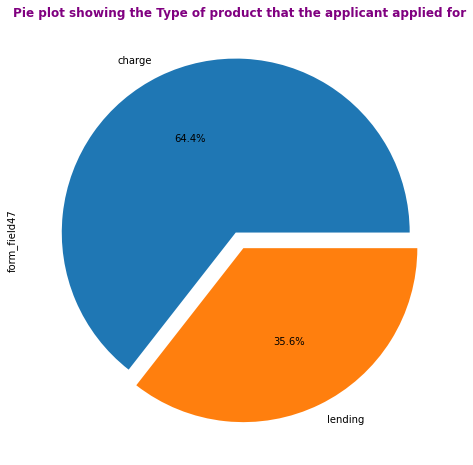

In [ ]:
plt.figure(figsize=(8,8))

plt.title('Pie plot showing the Type of product that the applicant applied for',fontdict={'fontsize':12,'fontweight':'bold','color':'purple'},loc='center')

Test['form_field47'].value_counts().plot(kind='pie',explode=[0.05,0.05],autopct='%2.1f%%')

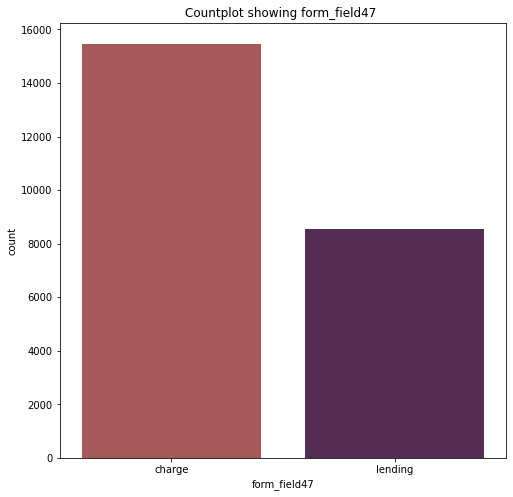

In [ ]:
plt.figure(figsize=(8,8))
plt.title('Countplot showing form_field47 ')
sns.countplot(x='form_field47',data=Test,palette=['red','purple'],saturation=0.3)

#**READING IN THE TRAIN DATASET**

In [4]:
Train = pd.read_csv('/content/drive/My Drive/DSN_Afolashade/Train.csv')

#**UNDERSTANDING THE TRAIN DATASET**

In [ ]:
Train.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,11333126.0,4397256.0,2301324.0,7875694.0,96375139,112181765.0,1.0,1.0,1.0,3.0,3.0,134.655,NaN,NaN,134.655,4000.5,17064.0,11376.0,60.0,17064.0,5962.0,NaN,1052.0,8.0000,2.0,NaN,12.0,12.0,4.0,0.0,NaN,NaN,0.392854,2.02,0.711632,0.0,0.0,charge,NaN,1.129518,0.044335,no
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,2533168.0,244292.0,3982971.0,2141445.0,28141427,45169902.0,1.0,1.0,1.0,2.0,2.0,109.230,11385.24,14584.29,86.685,4161.0,13413.0,8942.0,304.0,13413.0,5780.0,NaN,2554.0,17.5000,0.0,0.0,16.0,24.0,8.0,0.0,NaN,NaN,0.314281,8.08,0.183584,NaN,0.0,charge,349.805730,1.620483,0.322436,no
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,NaN,956940.0,NaN,192944.0,1079864.0,NaN,NaN,0.0,16576457,22452691.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,1597.5,4746.0,3164.0,60.0,15696.0,NaN,14508.0,70.0,0.6666,0.0,NaN,12.0,0.0,6.0,0.0,149.6805,NaN,0.162965,18.18,0.791136,0.0,0.0,charge,NaN,1.513370,0.011640,yes
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,3621979.0,NaN,771776.0,1186839.0,48187375,136297820.0,0.0,0.0,0.0,1.0,1.0,120.120,8580.00,0.00,85.800,1701.0,4014.0,2676.0,60.0,11679.0,NaN,NaN,522.0,7.8334,1.0,1.0,4.0,8.0,4.0,1.0,NaN,NaN,0.488884,2.02,0.685168,NaN,0.0,charge,89.940100,0.664452,0.082729,no
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,361770.0,396391.0,818456.0,511535.0,28141427,15292757.0,0.0,0.0,0.0,3.0,3.0,104.535,8360.19,10326.45,115.335,1551.0,3285.0,2190.0,60.0,19437.0,12958.0,5202.0,272.0,1.0000,0.0,0.0,24.0,2.0,24.0,0.0,150.0135,NaN,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,no


In [ ]:
Train.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,11333126.0,4397256.0,2301324.0,7875694.0,96375139,112181765.0,1.0,1.0,1.0,3.0,3.0,134.655,NaN,NaN,134.655,4000.5,17064.0,11376.0,60.0,17064.0,5962.0,NaN,1052.0,8.0000,2.0,NaN,12.0,12.0,4.0,0.0,NaN,NaN,0.392854,2.02,0.711632,0.0,0.0,charge,NaN,1.129518,0.044335,no
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,2533168.0,244292.0,3982971.0,2141445.0,28141427,45169902.0,1.0,1.0,1.0,2.0,2.0,109.230,11385.24,14584.29,86.685,4161.0,13413.0,8942.0,304.0,13413.0,5780.0,NaN,2554.0,17.5000,0.0,0.0,16.0,24.0,8.0,0.0,NaN,NaN,0.314281,8.08,0.183584,NaN,0.0,charge,349.805730,1.620483,0.322436,no
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,NaN,956940.0,NaN,192944.0,1079864.0,NaN,NaN,0.0,16576457,22452691.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,1597.5,4746.0,3164.0,60.0,15696.0,NaN,14508.0,70.0,0.6666,0.0,NaN,12.0,0.0,6.0,0.0,149.6805,NaN,0.162965,18.18,0.791136,0.0,0.0,charge,NaN,1.513370,0.011640,yes
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,3621979.0,NaN,771776.0,1186839.0,48187375,136297820.0,0.0,0.0,0.0,1.0,1.0,120.120,8580.00,0.00,85.800,1701.0,4014.0,2676.0,60.0,11679.0,NaN,NaN,522.0,7.8334,1.0,1.0,4.0,8.0,4.0,1.0,NaN,NaN,0.488884,2.02,0.685168,NaN,0.0,charge,89.940100,0.664452,0.082729,no
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,361770.0,396391.0,818456.0,511535.0,28141427,15292757.0,0.0,0.0,0.0,3.0,3.0,104.535,8360.19,10326.45,115.335,1551.0,3285.0,2190.0,60.0,19437.0,12958.0,5202.0,272.0,1.0000,0.0,0.0,24.0,2.0,24.0,0.0,150.0135,NaN,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,no


In [ ]:
Train.columns

Index(['Applicant_ID', 'form_field1', 'form_field2', 'form_field3',
       'form_field4', 'form_field5', 'form_field6', 'form_field7',
       'form_field8', 'form_field9', 'form_field10', 'form_field11',
       'form_field12', 'form_field13', 'form_field14', 'form_field15',
       'form_field16', 'form_field17', 'form_field18', 'form_field19',
       'form_field20', 'form_field21', 'form_field22', 'form_field23',
       'form_field24', 'form_field25', 'form_field26', 'form_field27',
       'form_field28', 'form_field29', 'form_field30', 'form_field31',
       'form_field32', 'form_field33', 'form_field34', 'form_field35',
       'form_field36', 'form_field37', 'form_field38', 'form_field39',
       'form_field40', 'form_field41', 'form_field42', 'form_field43',
       'form_field44', 'form_field45', 'form_field46', 'form_field47',
       'form_field48', 'form_field49', 'form_field50', 'default_status'],
      dtype='object')

In [ ]:
Train.shape

(56000, 52)

In [ ]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 52 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Applicant_ID    56000 non-null  object 
 1   form_field1     53471 non-null  float64
 2   form_field2     52156 non-null  float64
 3   form_field3     55645 non-null  float64
 4   form_field4     55645 non-null  float64
 5   form_field5     55645 non-null  float64
 6   form_field6     42640 non-null  float64
 7   form_field7     50837 non-null  float64
 8   form_field8     42640 non-null  float64
 9   form_field9     47992 non-null  float64
 10  form_field10    55645 non-null  float64
 11  form_field11    24579 non-null  float64
 12  form_field12    46105 non-null  float64
 13  form_field13    50111 non-null  float64
 14  form_field14    56000 non-null  int64  
 15  form_field15    33525 non-null  float64
 16  form_field16    42964 non-null  float64
 17  form_field17    44849 non-null 

In [ ]:
Train.describe()

,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field48,form_field49,form_field50
count,53471.000000,52156.000000,55645.000000,55645.000000,55645.000000,4.264000e+04,5.083700e+04,4.264000e+04,4.799200e+04,5.564500e+04,2.457900e+04,4.610500e+04,5.011100e+04,5.600000e+04,3.352500e+04,42964.000000,44849.000000,45598.000000,55996.000000,55645.000000,40146.000000,35600.000000,27877.000000,42703.000000,50550.000000,48562.000000,46701.000000,55645.000000,55645.000000,30491.000000,16592.000000,50550.000000,54744.000000,55645.000000,32852.000000,54005.000000,50550.000000,55645.000000,51789.000000,12271.000000,17771.000000,54677.000000,55432.000000,50617.000000,24683.000000,40096.000000,3.511100e+04,55645.000000,4.494400e+04
mean,3491.795665,0.550737,1.052225,0.851979,1.956317,6.244479e+05,6.865210e+06,2.626690e+06,1.316002e+07,1.185585e+07,2.054715e+06,2.771113e+06,6.009944e+06,6.914875e+07,1.145041e+08,0.230425,0.265692,0.271832,0.948800,1.031593,86.500380,6628.316381,6452.875072,104.558516,2624.555935,10106.554899,6190.516948,17274.315141,16518.540695,5213.246663,10857.565755,938.345321,13.926583,0.230245,0.199866,12.859069,8.480435,8.601420,0.090849,147.797977,108.117363,0.368215,6.634511,0.563377,0.072520,0.095371,3.052449e+05,1.049061,6.005862e+05
std,188.462426,0.820979,2.147768,3.157692,10.512396,1.433422e+06,1.912729e+07,3.927355e+06,1.977963e+07,2.669459e+07,4.912980e+06,4.544838e+06,2.335893e+07,2.713995e+09,1.153842e+08,0.621833,0.720198,0.725434,1.736454,1.785122,53.445528,5661.059297,5739.968774,436.670719,1964.226548,8796.472481,5390.915344,26930.742020,9666.183962,3124.491488,6049.678489,1044.597044,15.208396,0.683063,0.574002,10.621984,9.328810,7.969215,0.423802,45.085889,36.765769,0.412858,6.378946,0.196973,0.291146,0.335210,1.647757e+06,1.806160,5.842405e+06
min,2990.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.395430e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.255000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166600,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.021000,0.000000,0.000000,0.000000,0.048528,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,3358.000000,0.070788,0.000000,0.000000,0.000000,1.400400e+04,6.869740e+05,1.929440e+05,1.368502e+06,4.500730e+05,2.172565e+05,2.758010e+05,1.921660e+05,1.657646e+07,5.007636e+07,0.000000,0.000000,0.000000,0.000000,0.000000,40.305000,1068.667500,797.145000,14.865000,1231.500000,3375.000000,2068.000000,60.000000,9765.000000,2312.000000,6297.000000,194.000000,2.333400,0.000000,0.000000,6.000000,2.000000,4.000000,0.000000,136.191750,87.055500,0.000000,2.020000,0.411672,0.000000,0.000000,7.710079e+01,0.000000,4.560141e-02
50%,3484.000000,0.267575,0.062000,0.000000,0.000000,1.155330e+05,2.704328e+06,9.639420e+05,5.506295e+06,3.707559e+06,6.986440e+05,1.163110e+06,1.605792e+06,2.814143e+07,8.442428e+07,0.000000,0.000000,0.000000,0.000000,0.000000,89.167500,5976.225000,5548.935000,60.660000,2203.500000,8214.000000,5110.000000,486.000000,15057.000000,5658.000000,10584.000000,598.000000,7.833400,0.000000,0.000000,10.000000,6.000000,6.000000,0.000000,150.000000,118.441500,0.220000,5.050000,0.588648,0.000000,0.000000,3.181243e+02,0.000000,1.703996e-01
75%,3620.000000,0.719512,1.282000,0.000000,0.000000,5.259280e+05,6.993831e+06,3.751516e+06,1.694552

#**TRAIN DATASET DATA CLEANING**

In [ ]:
Train.isnull().sum()

Applicant_ID          0
form_field1        2529
form_field2        3844
form_field3         355
form_field4         355
form_field5         355
form_field6       13360
form_field7        5163
form_field8       13360
form_field9        8008
form_field10        355
form_field11      31421
form_field12       9895
form_field13       5889
form_field14          0
form_field15      22475
form_field16      13036
form_field17      11151
form_field18      10402
form_field19          4
form_field20        355
form_field21      15854
form_field22      20400
form_field23      28123
form_field24      13297
form_field25       5450
form_field26       7438
form_field27       9299
form_field28        355
form_field29        355
form_field30      25509
form_field31      39408
form_field32       5450
form_field33       1256
form_field34        355
form_field35      23148
form_field36       1995
form_field37       5450
form_field38        355
form_field39       4211
form_field40      43729
form_field41    

In [ ]:
Train=Train.fillna(-999)
Train.isnull().sum()

Applicant_ID      0
form_field1       0
form_field2       0
form_field3       0
form_field4       0
form_field5       0
form_field6       0
form_field7       0
form_field8       0
form_field9       0
form_field10      0
form_field11      0
form_field12      0
form_field13      0
form_field14      0
form_field15      0
form_field16      0
form_field17      0
form_field18      0
form_field19      0
form_field20      0
form_field21      0
form_field22      0
form_field23      0
form_field24      0
form_field25      0
form_field26      0
form_field27      0
form_field28      0
form_field29      0
form_field30      0
form_field31      0
form_field32      0
form_field33      0
form_field34      0
form_field35      0
form_field36      0
form_field37      0
form_field38      0
form_field39      0
form_field40      0
form_field41      0
form_field42      0
form_field43      0
form_field44      0
form_field45      0
form_field46      0
form_field47      0
form_field48      0
form_field49      0


In [ ]:
Train.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62       False
63       False
64       False
65       False
66       F

In [ ]:
Train[Train.duplicated()==True]

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status


In [ ]:
Train.drop_duplicates().head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,11333126.0,4397256.0,2301324.0,7875694.0,96375139,112181765.0,1.0,1.0,1.0,3.0,3.0,134.655,-999.00,-999.00,134.655,4000.5,17064.0,11376.0,60.0,17064.0,5962.0,-999.0,1052.0,8.0000,2.0,-999.0,12.0,12.0,4.0,0.0,-999.0000,-999.0,0.392854,2.02,0.711632,0.0,0.0,charge,-999.000000,1.129518,0.044335,no
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,2533168.0,244292.0,3982971.0,2141445.0,28141427,45169902.0,1.0,1.0,1.0,2.0,2.0,109.230,11385.24,14584.29,86.685,4161.0,13413.0,8942.0,304.0,13413.0,5780.0,-999.0,2554.0,17.5000,0.0,0.0,16.0,24.0,8.0,0.0,-999.0000,-999.0,0.314281,8.08,0.183584,-999.0,0.0,charge,349.805730,1.620483,0.322436,no
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,-999.0,956940.0,-999.0,192944.0,1079864.0,-999.0,-999.0,0.0,16576457,22452691.0,-999.0,-999.0,-999.0,0.0,0.0,-999.000,-999.00,-999.00,-999.000,1597.5,4746.0,3164.0,60.0,15696.0,-999.0,14508.0,70.0,0.6666,0.0,-999.0,12.0,0.0,6.0,0.0,149.6805,-999.0,0.162965,18.18,0.791136,0.0,0.0,charge,-999.000000,1.513370,0.011640,yes
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,3621979.0,-999.0,771776.0,1186839.0,48187375,136297820.0,0.0,0.0,0.0,1.0,1.0,120.120,8580.00,0.00,85.800,1701.0,4014.0,2676.0,60.0,11679.0,-999.0,-999.0,522.0,7.8334,1.0,1.0,4.0,8.0,4.0,1.0,-999.0000,-999.0,0.488884,2.02,0.685168,-999.0,0.0,charge,89.940100,0.664452,0.082729,no
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,361770.0,396391.0,818456.0,511535.0,28141427,15292757.0,0.0,0.0,0.0,3.0,3.0,104.535,8360.19,10326.45,115.335,1551.0,3285.0,2190.0,60.0,19437.0,12958.0,5202.0,272.0,1.0000,0.0,0.0,24.0,2.0,24.0,0.0,150.0135,-999.0,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,no


In [ ]:
Train.shape

(56000, 52)

In [ ]:
#Train=Train.drop(['Applicant_ID'], axis=1)
Train.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,11333126.0,4397256.0,2301324.0,7875694.0,96375139,112181765.0,1.0,1.0,1.0,3.0,3.0,134.655,-999.00,-999.00,134.655,4000.5,17064.0,11376.0,60.0,17064.0,5962.0,-999.0,1052.0,8.0000,2.0,-999.0,12.0,12.0,4.0,0.0,-999.0000,-999.0,0.392854,2.02,0.711632,0.0,0.0,charge,-999.000000,1.129518,0.044335,no
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,2533168.0,244292.0,3982971.0,2141445.0,28141427,45169902.0,1.0,1.0,1.0,2.0,2.0,109.230,11385.24,14584.29,86.685,4161.0,13413.0,8942.0,304.0,13413.0,5780.0,-999.0,2554.0,17.5000,0.0,0.0,16.0,24.0,8.0,0.0,-999.0000,-999.0,0.314281,8.08,0.183584,-999.0,0.0,charge,349.805730,1.620483,0.322436,no
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,-999.0,956940.0,-999.0,192944.0,1079864.0,-999.0,-999.0,0.0,16576457,22452691.0,-999.0,-999.0,-999.0,0.0,0.0,-999.000,-999.00,-999.00,-999.000,1597.5,4746.0,3164.0,60.0,15696.0,-999.0,14508.0,70.0,0.6666,0.0,-999.0,12.0,0.0,6.0,0.0,149.6805,-999.0,0.162965,18.18,0.791136,0.0,0.0,charge,-999.000000,1.513370,0.011640,yes
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,3621979.0,-999.0,771776.0,1186839.0,48187375,136297820.0,0.0,0.0,0.0,1.0,1.0,120.120,8580.00,0.00,85.800,1701.0,4014.0,2676.0,60.0,11679.0,-999.0,-999.0,522.0,7.8334,1.0,1.0,4.0,8.0,4.0,1.0,-999.0000,-999.0,0.488884,2.02,0.685168,-999.0,0.0,charge,89.940100,0.664452,0.082729,no
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,361770.0,396391.0,818456.0,511535.0,28141427,15292757.0,0.0,0.0,0.0,3.0,3.0,104.535,8360.19,10326.45,115.335,1551.0,3285.0,2190.0,60.0,19437.0,12958.0,5202.0,272.0,1.0000,0.0,0.0,24.0,2.0,24.0,0.0,150.0135,-999.0,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,no


#**TRAIN DATASET EXPLORATORY DATA ANALYSIS**

In [ ]:
#value count for default_status
Train['default_status'].value_counts()

no     42285
yes    13715
Name: default_status, dtype: int64

In [ ]:
#value count for Applicant_ID
Train['Applicant_ID'].value_counts()

Apcnt_1230792    1
Apcnt_1165988    1
Apcnt_1212248    1
Apcnt_1118140    1
Apcnt_986376     1
Apcnt_985984     1
Apcnt_989156     1
Apcnt_925412     1
Apcnt_941752     1
Apcnt_1121832    1
Apcnt_999192     1
Apcnt_1117300    1
Apcnt_961828     1
Apcnt_1006512    1
Apcnt_1082544    1
Apcnt_1088876    1
Apcnt_937500     1
Apcnt_1057708    1
Apcnt_1155304    1
Apcnt_926236     1
Apcnt_1053884    1
Apcnt_942536     1
Apcnt_1180316    1
Apcnt_1049420    1
Apcnt_1207256    1
Apcnt_1190604    1
Apcnt_1066316    1
Apcnt_1044372    1
Apcnt_1170092    1
Apcnt_952460     1
Apcnt_1006092    1
Apcnt_994696     1
Apcnt_951864     1
Apcnt_990860     1
Apcnt_1096260    1
Apcnt_936764     1
Apcnt_1022920    1
Apcnt_1195348    1
Apcnt_935048     1
Apcnt_931852     1
Apcnt_1150732    1
Apcnt_1181604    1
Apcnt_1224168    1
Apcnt_1087644    1
Apcnt_1105036    1
Apcnt_937536     1
Apcnt_948396     1
Apcnt_1099196    1
Apcnt_986236     1
Apcnt_925224     1
Apcnt_1129176    1
Apcnt_1205304    1
Apcnt_121642

In [ ]:
#Value count for Applicant_ID by default_status.
Train.groupby(['Applicant_ID','default_status'])['Applicant_ID'].count()

Applicant_ID   default_status
Apcnt_1000000  no                1
Apcnt_1000004  no                1
Apcnt_1000008  yes               1
Apcnt_1000012  no                1
Apcnt_1000016  no                1
Apcnt_1000020  no                1
Apcnt_1000024  yes               1
Apcnt_1000028  no                1
Apcnt_1000036  no                1
Apcnt_1000040  yes               1
Apcnt_1000044  no                1
Apcnt_1000056  no                1
Apcnt_1000060  no                1
Apcnt_1000064  no                1
Apcnt_1000068  no                1
Apcnt_1000072  no                1
Apcnt_1000088  yes               1
Apcnt_1000092  no                1
Apcnt_1000096  yes               1
Apcnt_1000100  no                1
Apcnt_1000108  no                1
Apcnt_1000112  no                1
Apcnt_1000120  yes               1
Apcnt_1000124  no                1
Apcnt_1000132  no                1
Apcnt_1000136  no                1
Apcnt_1000140  no                1
Apcnt_1000144  no        

In [ ]:
#Value count for default_status by Applicant_ID.
Train.groupby(['default_status','Applicant_ID'])['default_status'].count()

default_status  Applicant_ID 
no              Apcnt_1000000    1
                Apcnt_1000004    1
                Apcnt_1000012    1
                Apcnt_1000016    1
                Apcnt_1000020    1
                Apcnt_1000028    1
                Apcnt_1000036    1
                Apcnt_1000044    1
                Apcnt_1000056    1
                Apcnt_1000060    1
                Apcnt_1000064    1
                Apcnt_1000068    1
                Apcnt_1000072    1
                Apcnt_1000092    1
                Apcnt_1000100    1
                Apcnt_1000108    1
                Apcnt_1000112    1
                Apcnt_1000124    1
                Apcnt_1000132    1
                Apcnt_1000136    1
                Apcnt_1000140    1
                Apcnt_1000144    1
                Apcnt_1000148    1
                Apcnt_1000160    1
                Apcnt_1000164    1
                Apcnt_1000176    1
                Apcnt_1000180    1
                Apcnt_100

In [ ]:
#Value count for the type of product that the applicant applied for.
Train['form_field47'].value_counts()

charge     36373
lending    19627
Name: form_field47, dtype: int64

In [ ]:
#Value count for Applicant_ID by form_field47
Train.groupby(['Applicant_ID','form_field47'])['Applicant_ID'].count()

Applicant_ID   form_field47
Apcnt_1000000  charge          1
Apcnt_1000004  charge          1
Apcnt_1000008  charge          1
Apcnt_1000012  charge          1
Apcnt_1000016  charge          1
Apcnt_1000020  lending         1
Apcnt_1000024  charge          1
Apcnt_1000028  charge          1
Apcnt_1000036  charge          1
Apcnt_1000040  charge          1
Apcnt_1000044  charge          1
Apcnt_1000056  charge          1
Apcnt_1000060  lending         1
Apcnt_1000064  charge          1
Apcnt_1000068  charge          1
Apcnt_1000072  lending         1
Apcnt_1000088  charge          1
Apcnt_1000092  charge          1
Apcnt_1000096  charge          1
Apcnt_1000100  charge          1
Apcnt_1000108  charge          1
Apcnt_1000112  charge          1
Apcnt_1000120  charge          1
Apcnt_1000124  charge          1
Apcnt_1000132  charge          1
Apcnt_1000136  charge          1
Apcnt_1000140  charge          1
Apcnt_1000144  lending         1
Apcnt_1000148  charge          1
Apcnt_1000152  

In [ ]:
#Value count for forom_field47 by Applicant_ID.
Train.groupby(['form_field47','Applicant_ID'])['form_field47'].count()

form_field47  Applicant_ID 
charge        Apcnt_1000000    1
              Apcnt_1000004    1
              Apcnt_1000008    1
              Apcnt_1000012    1
              Apcnt_1000016    1
              Apcnt_1000024    1
              Apcnt_1000028    1
              Apcnt_1000036    1
              Apcnt_1000040    1
              Apcnt_1000044    1
              Apcnt_1000056    1
              Apcnt_1000064    1
              Apcnt_1000068    1
              Apcnt_1000088    1
              Apcnt_1000092    1
              Apcnt_1000096    1
              Apcnt_1000100    1
              Apcnt_1000108    1
              Apcnt_1000112    1
              Apcnt_1000120    1
              Apcnt_1000124    1
              Apcnt_1000132    1
              Apcnt_1000136    1
              Apcnt_1000140    1
              Apcnt_1000148    1
              Apcnt_1000152    1
              Apcnt_1000160    1
              Apcnt_1000164    1
              Apcnt_1000168    1
              A

In [ ]:
#what percentage of the default_status are yes?
Yes=(len(Train[Train.default_status=='yes'])/len(Train)) * 100

print('The percentage(%) of the default_status that are yes is {}'.format(Yes))

The percentage(%) of the default_status that are yes is 24.491071428571427


In [ ]:
#what percentage of the default_status are no?
No=(len(Train[Train.default_status=='no'])/len(Train)) * 100

print('The percentage(%) of the default_status that are no is {}'.format(No))

The percentage(%) of the default_status that are no is 75.50892857142857


#**TRAIN DATASET VISUALIZATION**

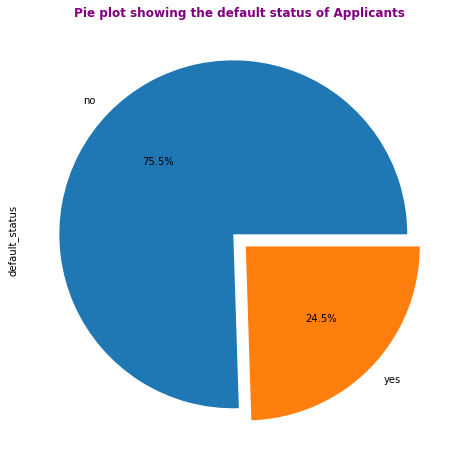

In [ ]:
plt.figure(figsize=(8,8))

plt.title('Pie plot showing the default status of Applicants',fontdict={'fontsize':12,'fontweight':'bold','color':'purple'},loc='center')

Train['default_status'].value_counts().plot(kind='pie',explode=[0.05,0.05],autopct='%2.1f%%')

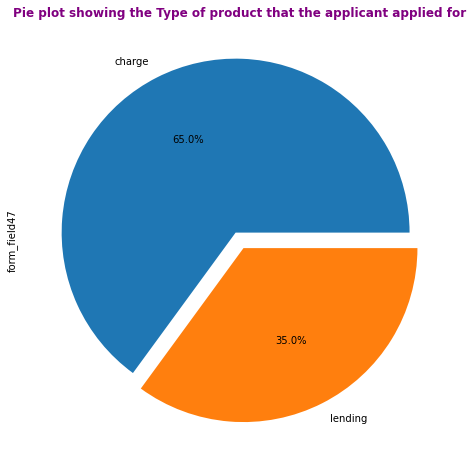

In [ ]:
plt.figure(figsize=(8,8))

plt.title('Pie plot showing the Type of product that the applicant applied for',fontdict={'fontsize':12,'fontweight':'bold','color':'purple'},loc='center')

Train['form_field47'].value_counts().plot(kind='pie',explode=[0.05,0.05],autopct='%2.1f%%')

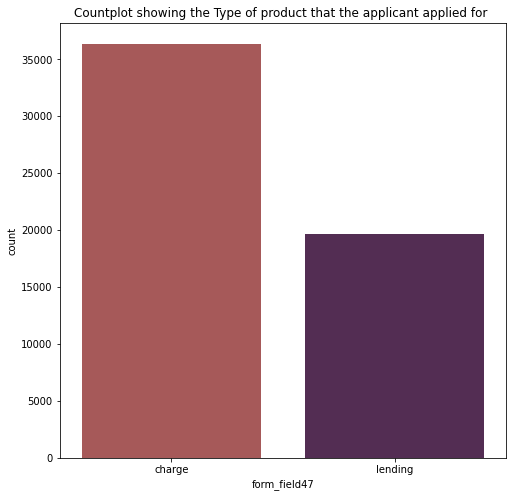

In [ ]:
plt.figure(figsize=(8,8))
plt.title('Countplot showing the Type of product that the applicant applied for ')
sns.countplot(x='form_field47',data=Train,palette=['red','purple'],saturation=0.3)

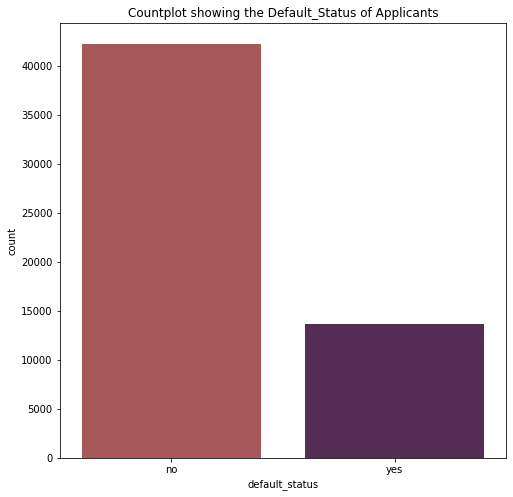

In [5]:
plt.figure(figsize=(8,8))
plt.title('Countplot showing the Default_Status of Applicants')
sns.countplot(x='default_status',data=Train,palette=['red','purple'],saturation=0.3)

#**FEATURE SELECTION**

In [ ]:
#Manual encoding

Train['default_status']=Train['default_status'].replace('no',0)
Train['default_status']=Train['default_status'].replace('yes',1)

Train['default_status']=Train['default_status'].astype('int')

#Train['form_field47']=Train['form_field47'].replace('lending',0)
#Train['form_field47']=Train['form_field47'].replace('charge',1)

#Train['form_field47']=Train['form_field47'].astype('int')

Train.head()

,Applicant_ID,form_field1,form_field2,form_field3,form_field4,form_field5,form_field6,form_field7,form_field8,form_field9,form_field10,form_field11,form_field12,form_field13,form_field14,form_field15,form_field16,form_field17,form_field18,form_field19,form_field20,form_field21,form_field22,form_field23,form_field24,form_field25,form_field26,form_field27,form_field28,form_field29,form_field30,form_field31,form_field32,form_field33,form_field34,form_field35,form_field36,form_field37,form_field38,form_field39,form_field40,form_field41,form_field42,form_field43,form_field44,form_field45,form_field46,form_field47,form_field48,form_field49,form_field50,default_status
0,Apcnt_1000000,3436.0,0.28505,1.6560,0.0,0.000,0.0,10689720.0,252072.0,4272776.0,11333126.0,4397256.0,2301324.0,7875694.0,96375139,112181765.0,1.0,1.0,1.0,3.0,3.0,134.655,NaN,NaN,134.655,4000.5,17064.0,11376.0,60.0,17064.0,5962.0,NaN,1052.0,8.0000,2.0,NaN,12.0,12.0,4.0,0.0,NaN,NaN,0.392854,2.02,0.711632,0.0,0.0,charge,NaN,1.129518,0.044335,0
1,Apcnt_1000004,3456.0,0.67400,0.2342,0.0,0.000,0.0,898979.0,497531.0,9073814.0,2533168.0,244292.0,3982971.0,2141445.0,28141427,45169902.0,1.0,1.0,1.0,2.0,2.0,109.230,11385.24,14584.29,86.685,4161.0,13413.0,8942.0,304.0,13413.0,5780.0,NaN,2554.0,17.5000,0.0,0.0,16.0,24.0,8.0,0.0,NaN,NaN,0.314281,8.08,0.183584,NaN,0.0,charge,349.805730,1.620483,0.322436,0
2,Apcnt_1000008,3276.0,0.53845,3.1510,0.0,6.282,NaN,956940.0,NaN,192944.0,1079864.0,NaN,NaN,0.0,16576457,22452691.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,1597.5,4746.0,3164.0,60.0,15696.0,NaN,14508.0,70.0,0.6666,0.0,NaN,12.0,0.0,6.0,0.0,149.6805,NaN,0.162965,18.18,0.791136,0.0,0.0,charge,NaN,1.513370,0.011640,1
3,Apcnt_1000012,3372.0,0.17005,0.5050,0.0,0.000,192166.0,3044703.0,385499.0,3986472.0,3621979.0,NaN,771776.0,1186839.0,48187375,136297820.0,0.0,0.0,0.0,1.0,1.0,120.120,8580.00,0.00,85.800,1701.0,4014.0,2676.0,60.0,11679.0,NaN,NaN,522.0,7.8334,1.0,1.0,4.0,8.0,4.0,1.0,NaN,NaN,0.488884,2.02,0.685168,NaN,0.0,charge,89.940100,0.664452,0.082729,0
4,Apcnt_1000016,3370.0,0.77270,1.1010,0.0,0.000,1556.0,214728.0,214728.0,1284089.0,361770.0,396391.0,818456.0,511535.0,28141427,15292757.0,0.0,0.0,0.0,3.0,3.0,104.535,8360.19,10326.45,115.335,1551.0,3285.0,2190.0,60.0,19437.0,12958.0,5202.0,272.0,1.0000,0.0,0.0,24.0,2.0,24.0,0.0,150.0135,NaN,0.275000,12.12,0.438168,0.0,0.0,charge,97.887502,1.427891,0.045630,0


#**SEPARATING FEATURES INTO INDEPENDENT(X) & TARGET(Y) FEATURES**

In [ ]:
X=Train.drop('default_status',axis=1)

Y=Train['default_status']

#**SPLITTING INTO TRAIN_TEST FOR VALIDATION**

In [ ]:
from sklearn.model_selection import train_test_split
X_Train,X_Test,Y_Train,Y_Test=train_test_split(X,Y,train_size=0.9,random_state=9,shuffle=True,stratify=Y)

#**MODEL BUILDING & MODEL SELECTION**

In [ ]:
CatB_feat_ind=np.where(X.dtypes==np.object)[0]

In [ ]:
CatB_feat_ind

array([ 0, 47])

In [ ]:
import catboost
from sklearn.metrics import *

ModuleNotFoundError: ignored

In [ ]:
!pip install catboost

     |████████████████████████████████| 66.1MB 46kB/s 


In [ ]:
from catboost import CatBoostClassifier

CatB= CatBoostClassifier(cat_features=CatB_feat_ind,learning_rate=0.0099,n_estimators=9000,max_depth=9,random_seed=9000,task_type = 'GPU',eval_metric="AUC")

eval_set = [(X_Test, Y_Test)]

CatB.fit(X_Train,Y_Train,early_stopping_rounds=500, eval_set=eval_set,verbose=200)

Y_CatB=CatB.predict_proba(X_Test)[:,1]
print("ROC_AUC_SCORE",roc_auc_score(Y_Test,Y_CatB))

0:	learn: 0.5000000	test: 0.5000000	best: 0.5000000 (0)	total: 29.5ms	remaining: 4m 25s
200:	learn: 0.7996474	test: 0.8061629	best: 0.8061629 (200)	total: 7.09s	remaining: 5m 10s
400:	learn: 0.8153705	test: 0.8189003	best: 0.8189015 (399)	total: 15.1s	remaining: 5m 24s
600:	learn: 0.8233133	test: 0.8261807	best: 0.8261807 (600)	total: 23.7s	remaining: 5m 31s
800:	learn: 0.8273573	test: 0.8296613	best: 0.8296613 (800)	total: 32.4s	remaining: 5m 31s
1000:	learn: 0.8296952	test: 0.8316745	best: 0.8316745 (1000)	total: 41s	remaining: 5m 27s
1200:	learn: 0.8315144	test: 0.8332437	best: 0.8332468 (1197)	total: 49.1s	remaining: 5m 19s
1400:	learn: 0.8327400	test: 0.8341631	best: 0.8341641 (1399)	total: 57.1s	remaining: 5m 9s
1600:	learn: 0.8340017	test: 0.8351549	best: 0.8351557 (1598)	total: 1m 5s	remaining: 5m 2s
1800:	learn: 0.8351511	test: 0.8360810	best: 0.8360810 (1800)	total: 1m 14s	remaining: 4m 55s
2000:	learn: 0.8360359	test: 0.8367376	best: 0.8367376 (2000)	total: 1m 22s	remaining:

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV 
KFold = StratifiedKFold(n_splits=10, shuffle=True, random_state=15000)

Test_Scores=[]
Prediction_Scores=[]

for Train_ix, Test_ix in KFold.split(X,Y):
    Train_X, Test_X=X.loc[Train_ix], X.loc[Test_ix]
    Train_Y, Test_Y=Y.loc[Train_ix], Y.loc[Test_ix]


    CatB=CatBoostClassifier(learning_rate=0.03,n_estimators=3000,max_depth=9,random_seed=9000,cat_features=CatB_feat_ind,eval_metric='AUC',task_type='GPU')
    eval=[(Test_X, Test_Y)]
    CatB.fit(Train_X, Train_Y, early_stopping_rounds=400, eval_set=eval_set, verbose=100)
        
    Y_Grid_CatB=CatB.predict_proba(Test_X)[:,1]
    P_Score=CatB.predict_proba(Test)[:,1]
    

    Test_Scores.append(Y_Grid_CatB)
    Prediction_Scores.append(P_Score)
    print("AUC Score:", roc_auc_score(Test_Y, Y_Grid_CatB))


mean_score=np.mean(Test_Scores, axis=0)
prediction=np.mean(Prediction_Scores, axis=0)

print("AUC Average Score:", roc_auc_score(Test_Y, mean_score))   

In [ ]:
X_Train.head()

In [ ]:
Y_Train.head()

In [ ]:
Prediction=CatB.predict_proba(Test)[:,1]

In [ ]:
NT=pd.read_csv("Test.csv")
NT.head()

In [ ]:
Submission=pd.DataFrame({"Applicant_ID":NT["Applicant_ID"], "default_status": Prediction})

In [ ]:
Submission.to_csv("Racheal_AboCoders_DSNfhhjj.csv", index=False)

In [ ]:
Submission.head()

In [ ]:
Submission.shape